In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
X= df.drop('quality', axis=1)
y= df['quality']

In [6]:
X.shape

(1599, 11)

In [7]:
y.shape

(1599,)

In [8]:
## Train test split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=30)

In [9]:
X_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [10]:
dt_modle = DecisionTreeClassifier()

In [11]:
dt_modle.fit(X_train,y_train)

DecisionTreeClassifier()

In [12]:
dt_modle.predict(X_test)

array([6, 3, 6, 6, 6, 5, 6, 6, 6, 3, 7, 6, 6, 5, 7, 4, 5, 5, 7, 6, 5, 7,
       5, 5, 5, 5, 8, 6, 5, 5, 5, 6, 6, 6, 6, 7, 6, 6, 5, 6, 6, 6, 7, 5,
       6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 5, 6, 5, 5, 6, 5, 6, 7, 5, 7, 5,
       5, 6, 5, 6, 6, 5, 5, 5, 6, 6, 7, 5, 6, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 6, 5, 5, 6, 4, 6, 6, 4, 6, 5, 4, 5, 5, 7, 7, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 7, 7, 5, 6, 6, 5, 6, 6, 7, 7, 6, 7, 5, 6, 5, 6, 5, 6, 5,
       6, 5, 5, 6, 5, 3, 7, 7, 5, 5, 6, 6, 5, 5, 5, 4, 6, 7, 5, 5, 4, 6,
       5, 6, 6, 6, 3, 5, 5, 6, 6, 5, 6, 5, 4, 5, 6, 6, 3, 6, 6, 6, 5, 6,
       5, 5, 6, 6, 5, 6, 7, 5, 6, 5, 4, 6, 4, 6, 5, 5, 5, 7, 6, 5, 7, 6,
       5, 8, 6, 5, 5, 5, 6, 7, 6, 6, 6, 6, 6, 5, 7, 5, 6, 5, 5, 5, 5, 6,
       6, 6, 7, 6, 5, 6, 5, 5, 7, 5, 5, 7, 7, 7, 5, 5, 5, 7, 6, 6, 5, 6,
       6, 5, 7, 6, 6, 7, 6, 5, 4, 7, 5, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6,
       5, 6, 6, 5, 6, 6, 5, 4, 6, 7, 5, 5, 7, 6, 5, 5, 5, 4, 5, 6, 5, 5,
       6, 5, 6, 6, 5, 6, 5, 7, 5, 6, 5, 6, 7, 6, 5,

In [13]:
dt_modle.score(X_test,y_test)

0.62

In [14]:
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree
%matplotlib inline



In [15]:
sklearn.__version__

'1.0.2'

[Text(0.546573622655584, 0.9722222222222222, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(0.3192302056692242, 0.9166666666666666, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(0.201120257885763, 0.8611111111111112, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(0.07744565217391304, 0.8055555555555556, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(0.054187979539641946, 0.75, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(0.017902813299232736, 0.6944444444444444, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(0.011082693947144074, 0.6388888888888888, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(0.0076726342710997444, 0.5833333333333334, 'X[3] <= 1.85\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(0.00426257459

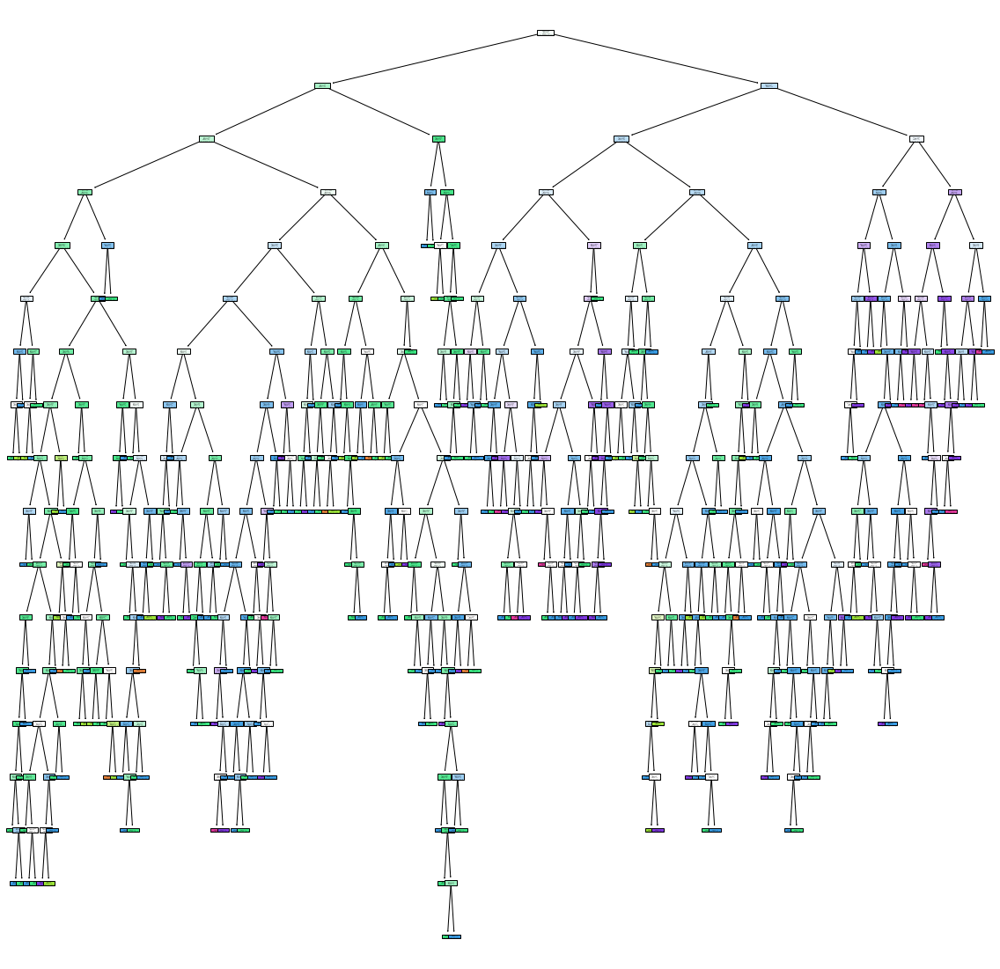

In [16]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_modle,filled=True)

In [17]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [18]:
df.quality.value_counts()

5    681
6    638
7    199
4     53
8     18
3     10
Name: quality, dtype: int64

In [19]:
df1 = df.head(30)

In [20]:
X1= df1.drop('quality', axis=1)
y1= df1['quality']

In [21]:
X1.shape

(30, 11)

[Text(0.375, 0.9166666666666666, 'X[1] <= 0.355\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.16666666666666666, 0.75, 'X[10] <= 10.15\ngini = 0.375\nsamples = 4\nvalue = [0, 0, 3, 1]'),
 Text(0.08333333333333333, 0.5833333333333334, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0]'),
 Text(0.25, 0.5833333333333334, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(0.5833333333333334, 0.75, 'X[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.4166666666666667, 0.5833333333333334, 'X[4] <= 0.076\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(0.3333333333333333, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(0.5, 0.4166666666666667, 'X[4] <= 0.081\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(0.4166666666666667, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.5833333333333334, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(0.75, 0.5833333333333334, 'X[5] <= 7.5\ngin

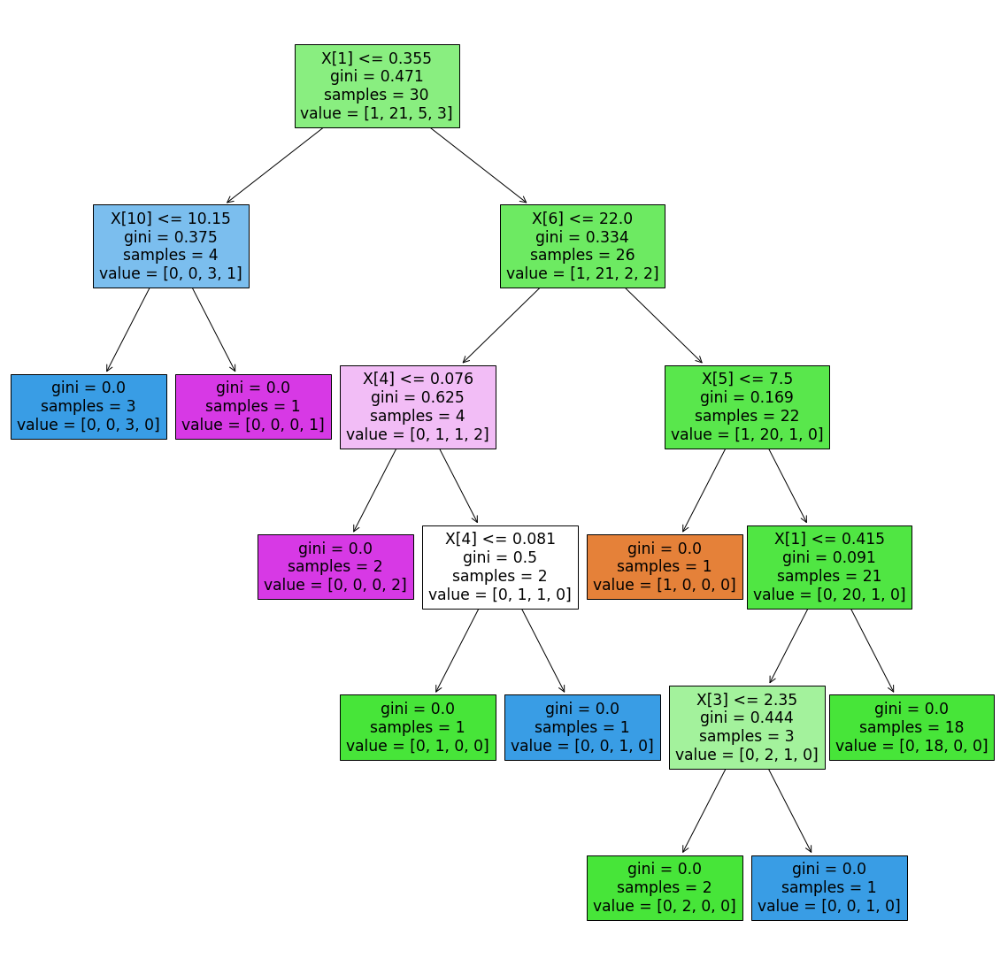

In [22]:
dt1 = DecisionTreeClassifier()
dt1.fit(X1,y1)



plt.figure(figsize=(20,20))
tree.plot_tree(dt1,filled=True)

In [23]:
set(y1)

{4, 5, 6, 7}

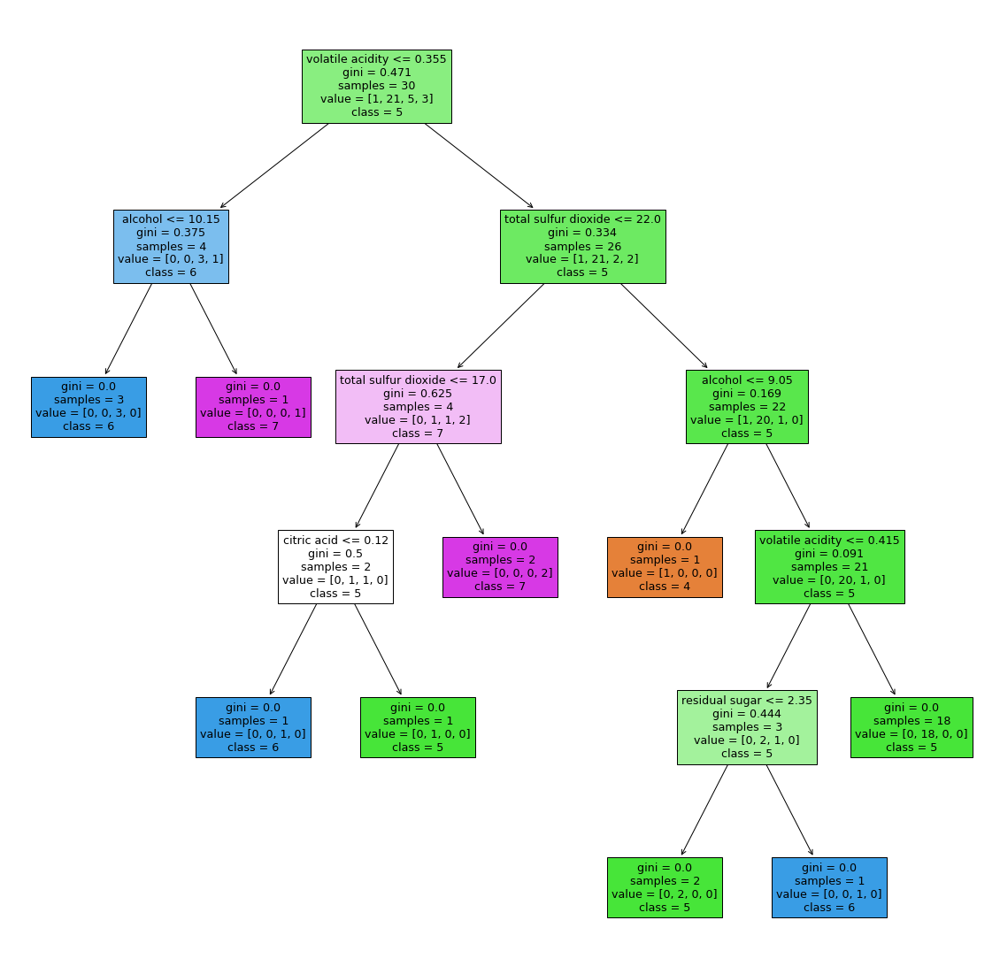

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt1.fit(X1,y1),filled=True,feature_names=X.columns, class_names=[str(i) for i in set(y1)])
plt.savefig('dsmodel')

In [28]:
dt1.predict(X1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [30]:
dt1.score(X1,y1)

1.0

In [29]:
dt_modle.score(X_test,y_test)

0.62

# CCP Alphas

In [25]:
path = dt1.cost_complexity_pruning_path(X1,y1)
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [26]:
ccp_alpha = path.ccp_alphas
ccp_alpha

array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
       0.06075036, 0.08216783, 0.13136752])

In [36]:


for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(X_train,y_train)
    dt_m.predict(X_test)
    score = dt_m.score(X_test,y_test)
    print("ccp is {} and model score is {} ".format(ccp,score))
    
    
    

ccp is 0.0 and model score is 0.64 
ccp is 0.03174603174603176 and model score is 0.545 
ccp is 0.03333333333333333 and model score is 0.545 
ccp is 0.049999999999999996 and model score is 0.545 
ccp is 0.05 and model score is 0.545 
ccp is 0.06075036075036072 and model score is 0.545 
ccp is 0.08216783216783222 and model score is 0.4225 
ccp is 0.1313675213675214 and model score is 0.4225 


In [37]:
dt_model2 = []
for ccp in ccp_alpha:
    dt_m1 = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m1.fit(X1,y1)
    dt_model2.append(dt_m1)

In [38]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

In [42]:
train_score = [i.score(X1,y1) for i in dt_model2]
train_score

[1.0,
 0.9666666666666667,
 0.9333333333333333,
 0.9,
 0.8666666666666667,
 0.8333333333333334,
 0.8,
 0.7]

In [44]:
test_score = [i.score(X_test,y_test) for i in dt_model2]
test_score

[0.49, 0.45, 0.455, 0.435, 0.44, 0.445, 0.485, 0.4225]

C:\Users\Sachin.Sen\AppData\Local\Temp\ipykernel_13948\1120149641.py:1: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "r-+" (-> marker='+'). The keyword argument will take precedence.
  plt.plot(ccp_alpha, train_score,'r-+',marker = 'o', label = 'Train score')


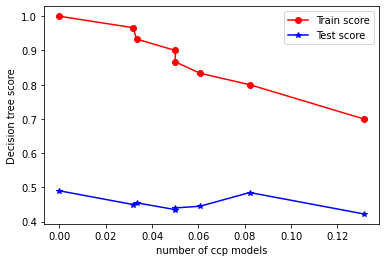

In [62]:
plt.plot(ccp_alpha, train_score,'r-+',marker = 'o', label = 'Train score')
plt.plot(ccp_alpha,test_score,'b-',marker = '*' ,label = 'Test score')
plt.xlabel('number of ccp models')
plt.ylabel('Decision tree score')
plt.legend()
plt.show()

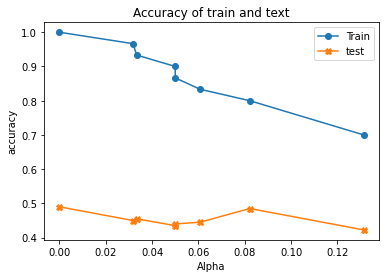

In [56]:
fig, ax = plt.subplots()
ax.set_xlabel('Alpha')
ax.set_ylabel('accuracy')
ax.set_title('Accuracy of train and text')
ax.plot(ccp_alpha,train_score,marker = 'o', label = 'Train')
ax.plot(ccp_alpha,test_score,marker = 'X', label = 'test')
ax.legend()
plt.show()